In [1]:
# Importing libraries:
from google import genai
from google.genai import types
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import base64
from IPython.display import display, HTML, clear_output

# Setting up and checking the API key:
COLAB = False # Set this to True for running on Colab
USE_DOTENV = True # Set this to False if you don't have a .env file for storing environment variables

if COLAB:
    USE_DOTENV = False
    dotenv_path = None
    from google.colab import userdata
    gemini_token = userdata.get('GEMINI_TOKEN')

if not COLAB:
  import os
  from dotenv import load_dotenv
  load_dotenv("../../apis/.env")
  gemini_token = os.getenv("GEMINI_API_KEY")

client = genai.Client(api_key=gemini_token)
def mask_token(token, unmasked_chars=3):
    return token[:unmasked_chars] + '*' * (len(token) - unmasked_chars*2) + token[-unmasked_chars:]
print(f"API key: {mask_token(gemini_token)}")

API key: AIz*********************************mrA


## Zero-shot text-to-image

### Needs vs Wants - no template

In [2]:
def generate_image(prompt, file_name, save_dir=".", temperature=0.5):
    response = client.models.generate_content(
        model="gemini-2.0-flash-exp-image-generation",
        contents=prompt,
        config=types.GenerateContentConfig(
            response_modalities=['Text', 'Image'],
            temperature=temperature,
        )
    )
    for part in response.candidates[0].content.parts:
      if part.text is not None:
        print(part.text)
      elif part.inline_data is not None:
        image = Image.open(BytesIO((part.inline_data.data)))
        image.save(f'{save_dir}/{file_name}.png')
    return response, image

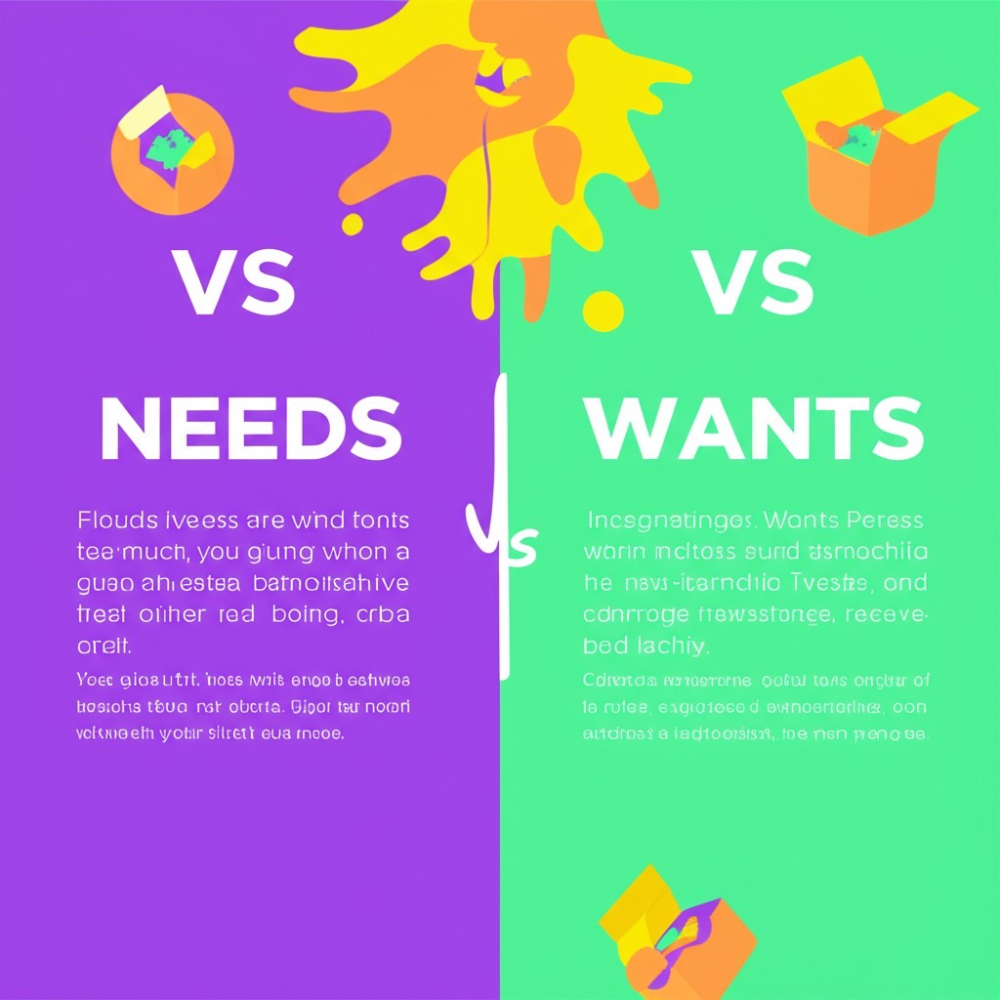

In [3]:
file_name = "needs_vs_wants_no_template"
save_dir="imgs"
prompt = "Create an image of a simple, yet colorful, infographic with two columns about this topic: “Needs vs Wants”"
response, image = generate_image(prompt=prompt, file_name=file_name, save_dir=save_dir)
display(image, metadata={"image/png": {"width": 800}})

Batch of images for the same prompt:

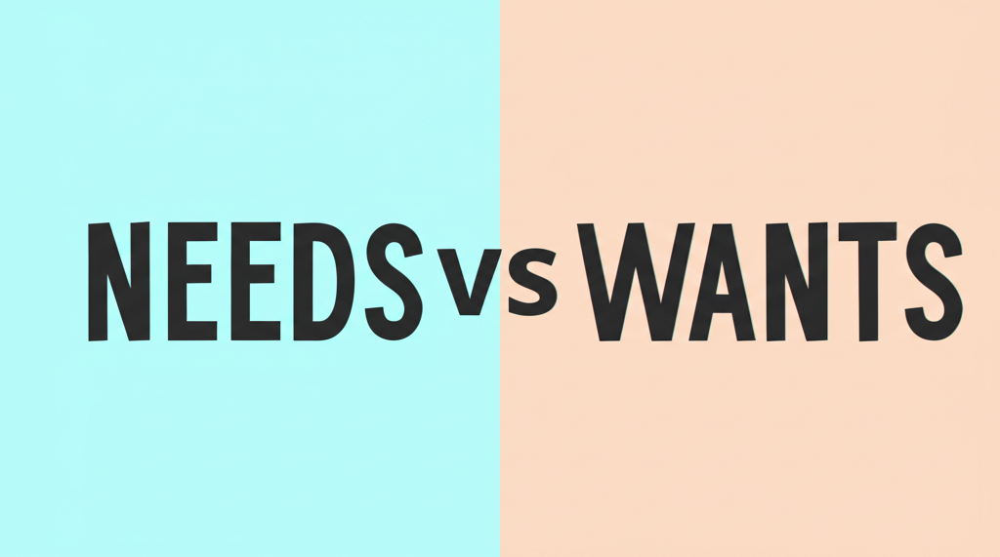

Image 9/9 generated


In [37]:
prompt = "Create an image of a simple, yet colorful, infographic with two columns about this topic: Needs vs Wants"
images = []
n_images = 9
for i in range(n_images):
    print(f"Generating image {i+1}")
    response, image = generate_image(prompt, f"needs_vs_wants_no_template_{i+1}", temperature=1.5)
    images.append(image)
    clear_output(wait=True)
    display(image)
    print(f"Image {i+1}/{n_images} generated") 

Display images in grid:

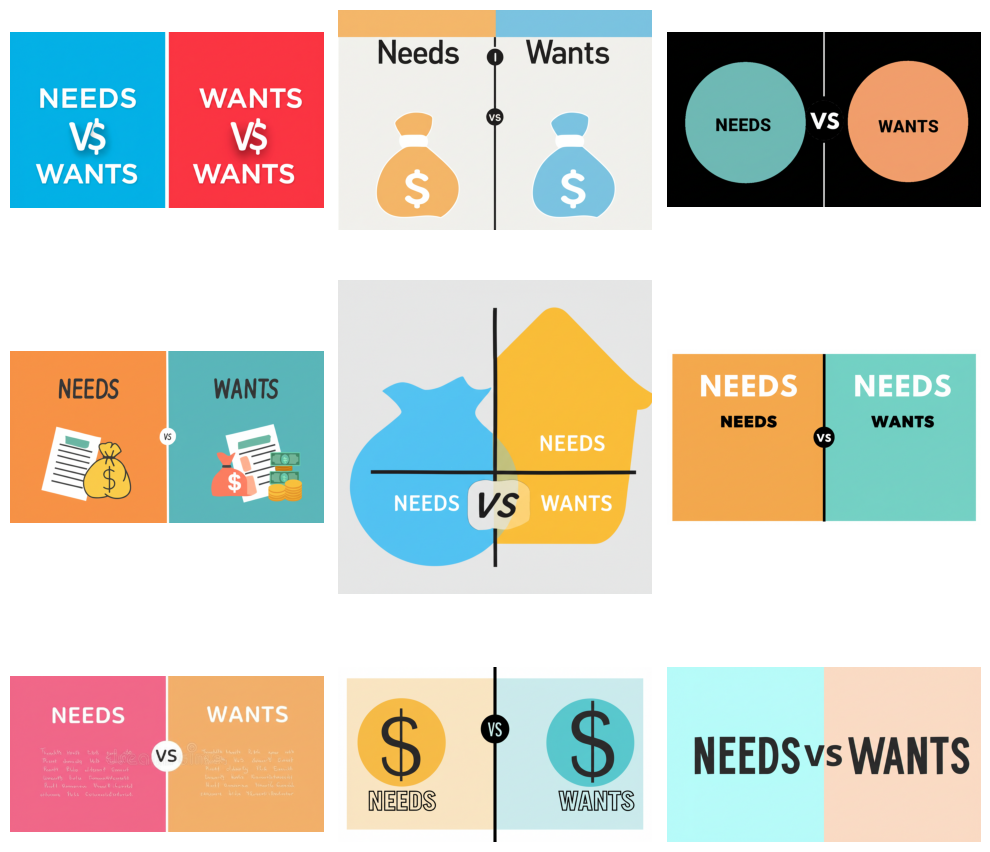

In [38]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10, 10))
for i, img in enumerate(images):
    row, col = divmod(i, 3)
    axes[row, col].imshow(img)
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()

### Style transfer from an HTML table

In [2]:
html_table = '''
<table>
  <tr>
    <th colspan="2">NEEDS VS WANTS</th>
  </tr>
  <tr>
    <td>FOOD</td>
    <td>MORE FOOD</td>
  </tr>
  <tr>
    <td>MONEY</td>
    <td>MORE MONEY</td>
  </tr>
</table>
'''
prompt = "Take the HTML code below and create a colorful and funny infographic, in 16:9 format:"
print(prompt)
display(HTML(html_table))

Take the HTML code below and create a colorful and funny infographic, in 16:9 format:


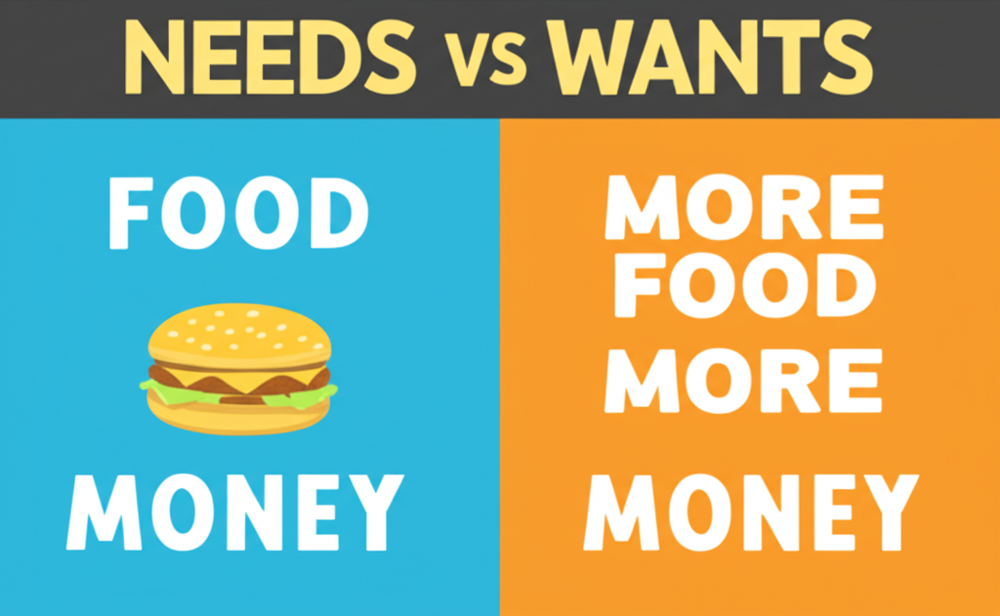

In [3]:
def generate_image(prompt, file_name, save_dir="imgs", temperature=0.5):
    response = client.models.generate_content(
        model="gemini-2.0-flash-exp-image-generation",
        contents=prompt,
        config=types.GenerateContentConfig(
            response_modalities=['Text', 'Image'],
            temperature=temperature,
        )
    )
    for part in response.candidates[0].content.parts:
      if part.text is not None:
        print(part.text)
      elif part.inline_data is not None:
        image = Image.open(BytesIO((part.inline_data.data)))
        image.save(f'{save_dir}/{file_name}.png')
    return response, image

prompt = f"{prompt}\n{html_table}"
response, image = generate_image(prompt, "needs_vs_wants_v1", temperature=0.9)
display(image)

### Multimodal prompts (text + image)

In [6]:
def generate_image_mm(prompt, input_file, output_file, save_dir="imgs", temperature=0.5):
    print("Generating image...")
    response = client.models.generate_content(
        model="gemini-2.0-flash-exp-image-generation",
        contents=[prompt, input_file],
        config=types.GenerateContentConfig(
            response_modalities=['Text', 'Image'],
            temperature=temperature,
        )
    )
    for part in response.candidates[0].content.parts:
      if part.text is not None:
        print(part.text)
      elif part.inline_data is not None:
        image = Image.open(BytesIO((part.inline_data.data)))
        image.save(f'{save_dir}/{output_file}.png')
    return response, image

Generating image...


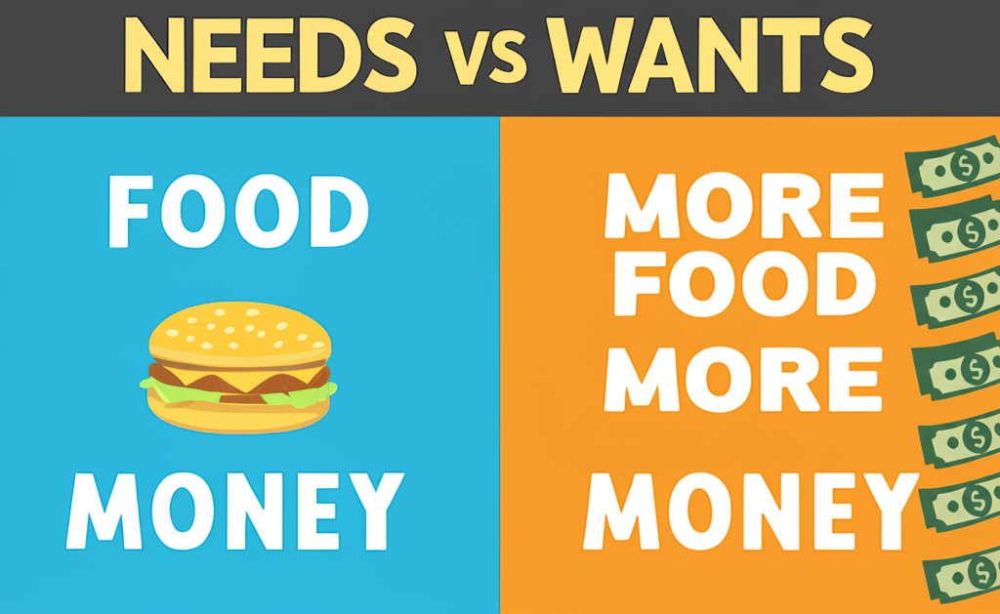

In [52]:
prompt = ("Add more food and money on the right side of the infographic, without altering the rest of the image.")
image = Image.open("imgs/needs_vs_wants_v1.png")
response, image = generate_image_mm(prompt=prompt, input_file=image, output_file="needs_vs_wants_v1_refined", temperature=0.9)
display(image, metadata={"image/png": {"width": 700}})

Generating image...


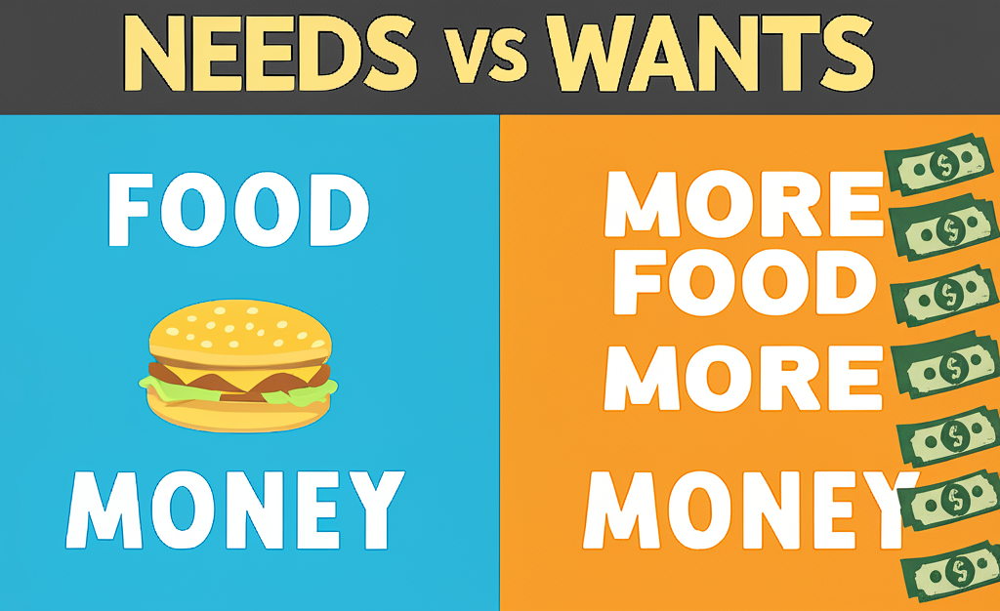

In [56]:
prompt = ("Add even more food and more money on the right side of the infographic, without altering the rest of the image.")
image = Image.open("imgs/needs_vs_wants_v1_refined.png")
response, image = generate_image_mm(prompt=prompt, input_file=image, output_file="needs_vs_wants_v1_refined_v2", temperature=1.3)
display(image, metadata={"image/png": {"width": 700}})

Generating image...


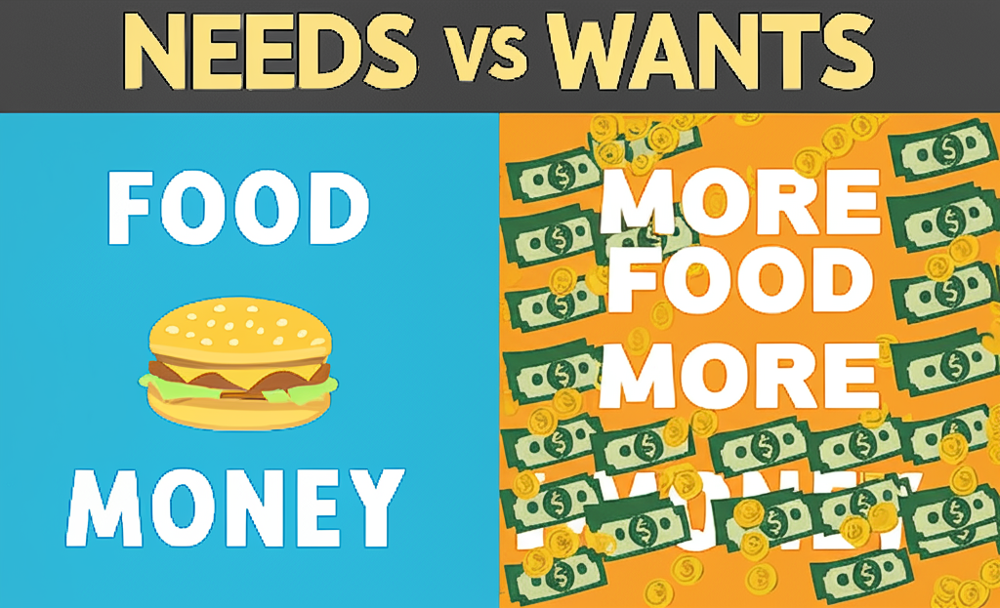

In [57]:
prompt = ("Add more food and more money on the right side of the infographic, without altering the rest of the image.")
image = Image.open("imgs/needs_vs_wants_v1_refined_v2.png")
response, image = generate_image_mm(prompt=prompt, input_file=image, output_file="needs_vs_wants_v1_refined_v3", temperature=1.3)
display(image, metadata={"image/png": {"width": 700}})

### Face swap

Generating image...


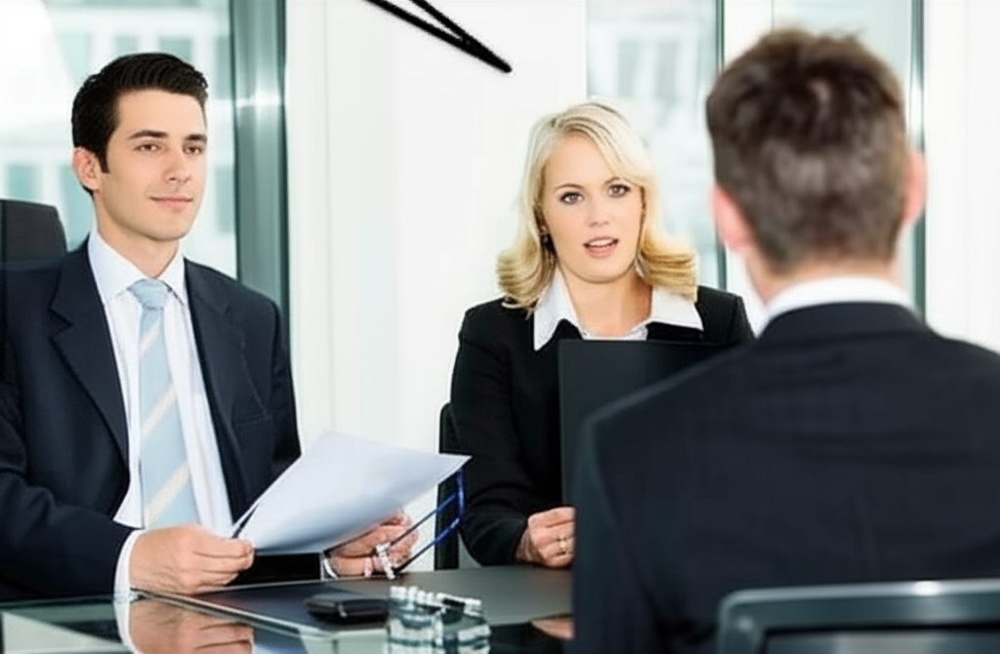

In [62]:
prompt = ("Replace the faces by other faces, without altering the rest of the image.")
image = Image.open("imgs/meme-swap/panel1.png")
response, image = generate_image_mm(prompt=prompt, input_file=image, output_file="panel1_swapped", save_dir='imgs/meme-swap', temperature=0.6)
display(image, metadata={"image/png": {"width": 700}})

Generating image...


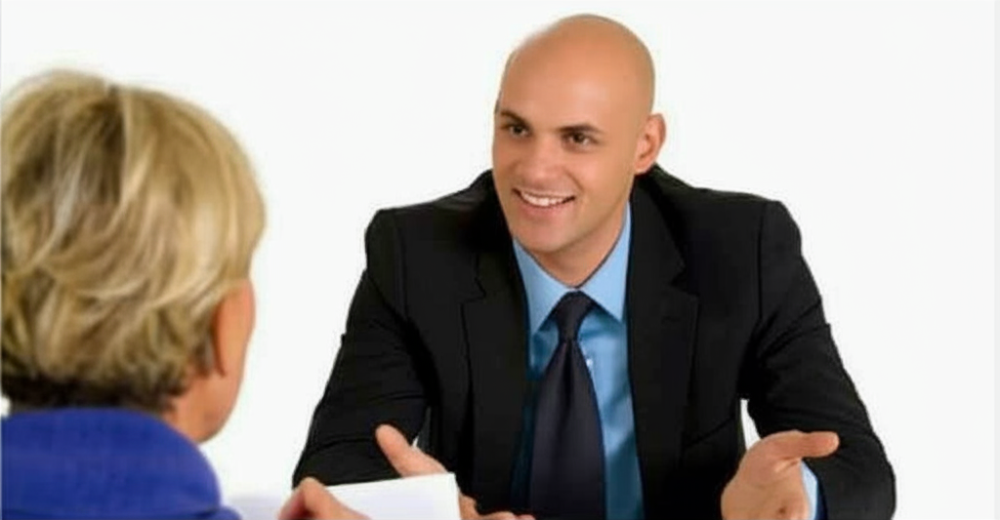

In [63]:
image = Image.open("imgs/meme-swap/panel2.png")
response, image = generate_image_mm(prompt=prompt, input_file=image, output_file="panel2_swapped", save_dir='imgs/meme-swap', temperature=0.6)
display(image, metadata={"image/png": {"width": 700}})

Generating image...


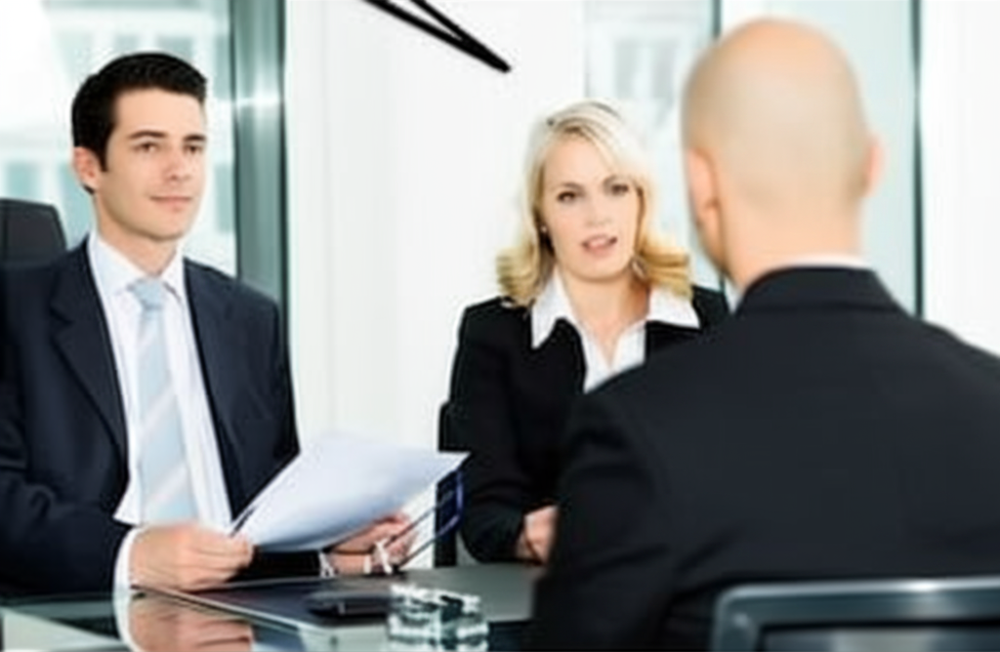

In [ ]:
prompt = ("Make the man on the right, the one who's facing backwards, be bald, without altering any other faces or the rest of the image.")
image = Image.open("imgs/meme-swap/panel1_swapped.png")
response, image = generate_image_mm(prompt=prompt, input_file=image, output_file="panel1_swapped_v2", save_dir='imgs/meme-swap', temperature=0.6)
display(image, metadata={"image/png": {"width": 700}})

### Meme template completion

Template:

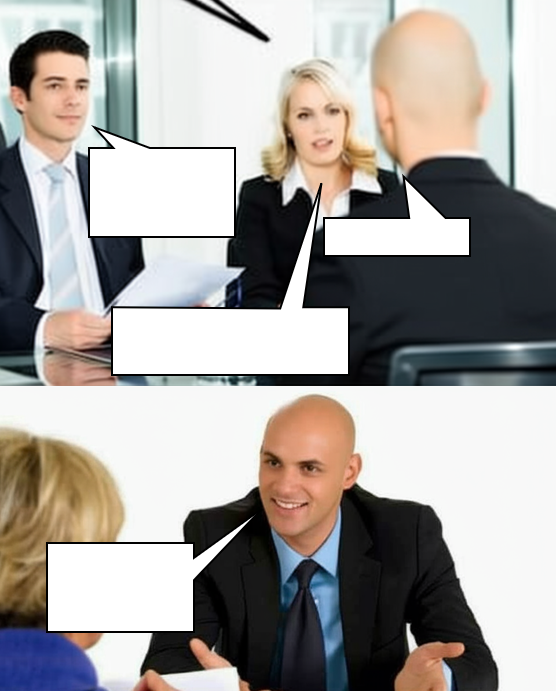

In [4]:
image = Image.open("imgs/meme-template.png")
display(image, metadata={"image/png": {"width": 700}})

Generating image...


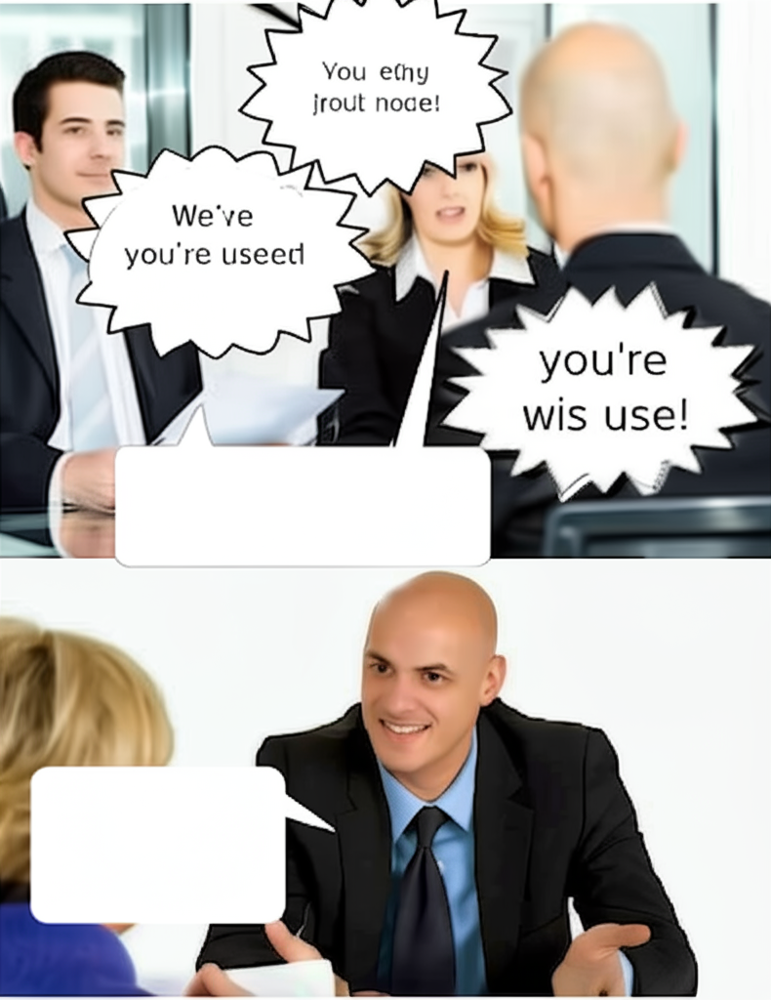

In [10]:
prompt = ("Write some funny text in speech bubbles without altering the rest of the meme.")
response, image = generate_image_mm(prompt=prompt, input_file=image, output_file="speech-bubble-inference", save_dir='imgs/meme-swap', temperature=0.6)
display(image, metadata={"image/png": {"width": 700}})

Generating image...


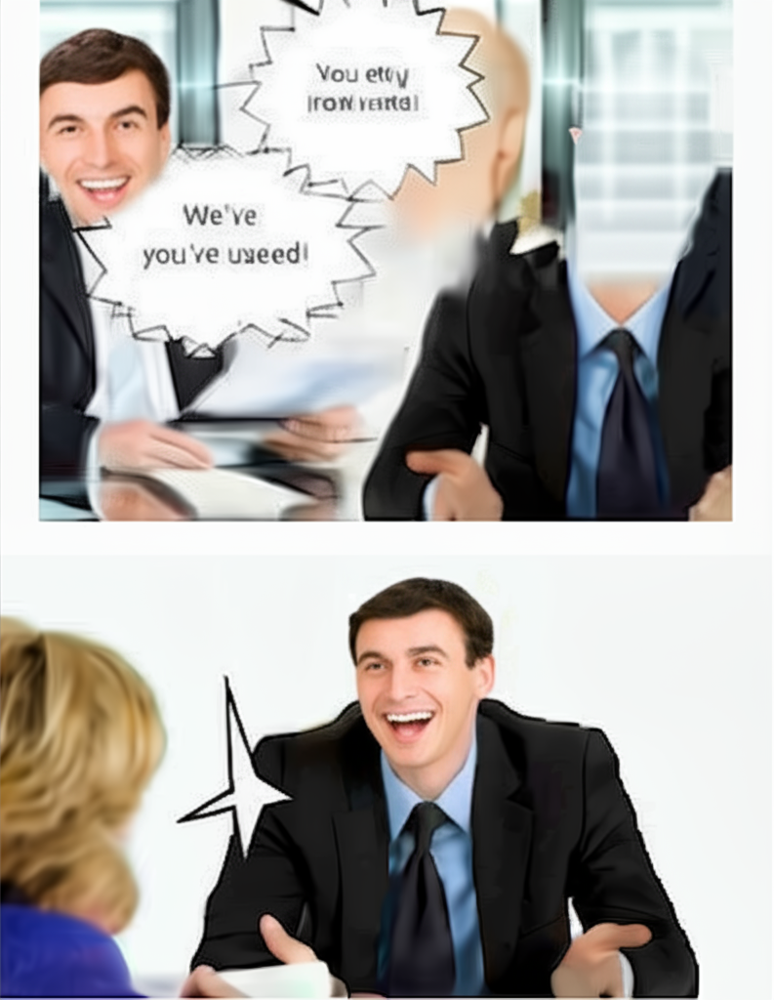

In [13]:
prompt = ("Change the faces of the characters, without altering the rest of the image")
response, image = generate_image_mm(prompt=prompt, input_file=image, output_file="speech-bubble-inference", save_dir='imgs/meme-swap', temperature=0.6)
display(image, metadata={"image/png": {"width": 700}})

Generating image...


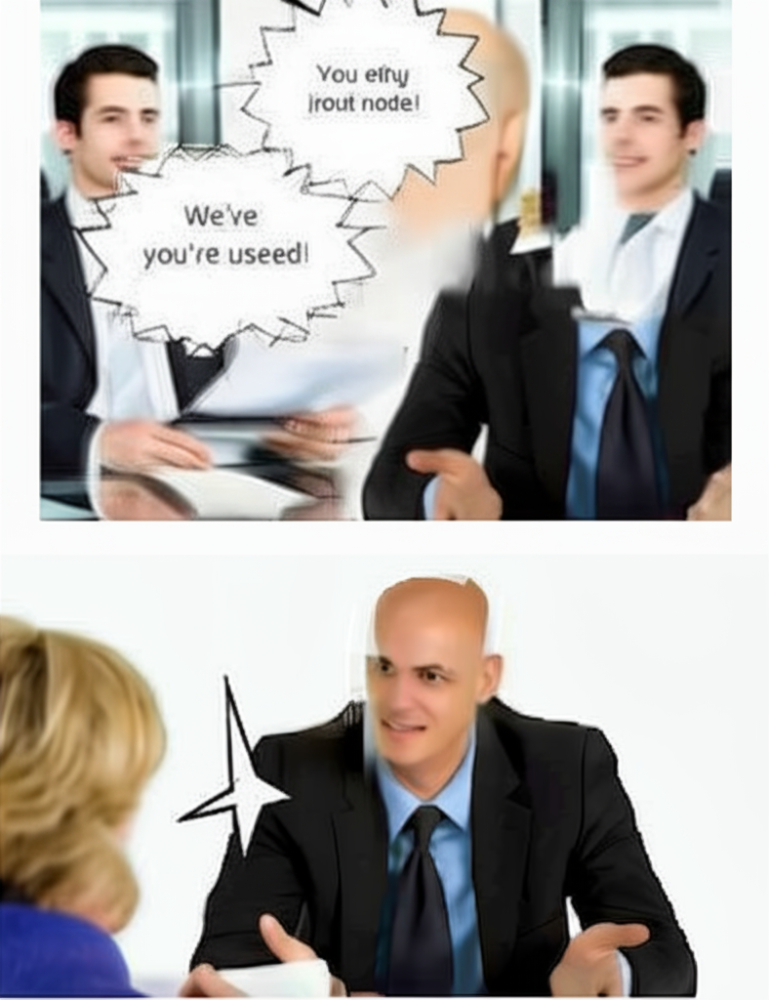

In [11]:
prompt = ("Swap the faces of the three characters in the two panels by other faces, ensuring they are consistent.\
           Notice the character who's facing backwards in the first panel faces the camera in the second panel. \
          And the character in the middle of the three from the first panel faces backwards in the second panel.")
response, image = generate_image_mm(prompt=prompt, input_file=image, output_file="speech-bubble-inference", save_dir='imgs/meme-swap', temperature=0.6)
display(image, metadata={"image/png": {"width": 700}})